In [2]:
import pandas as pd
import numpy as np
import dna_features_translator_class as dftc
import utils
import proseq_mito_peak_caller as pmpc
import pausing_index_calculator as pic
import os
from importlib import reload
import math
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
from statannotations.Annotator import Annotator
# Import chi2_contingency for statistical testing
from scipy.stats import chi2_contingency

PATH = os.getcwd()
reload(pmpc)
reload(utils)
reload(pic)
reload(dftc)
datapath = os.path.join(PATH)
plt.style.use('default')


In [4]:
_, hela, _ = utils.sample_loader(folder = os.path.join(PATH, 'data', 'proseq', 'HS_HeLa_sarah', 'nuc_first'), mode = 'all')
_, u87, _ = utils.sample_loader(folder = os.path.join(PATH, 'data', 'proseq', 'HS_U87_sarah', 'nuc_first'), mode = 'all')
_, d407, _ = utils.sample_loader(folder = os.path.join(PATH, 'data', 'proseq', 'HS_D407_sarah', 'nuc_first'), mode = 'all')


c:\Users\shtolz\Desktop\Hypoxia\2025_Mitochondria_Hypoxia_Project\utils.py:1735: DtypeWarning: Columns (34,35,37) have mixed types. Specify dtype option on import or set low_memory=False.
  sample = pd.read_csv(os.path.join(sample_path, i), index_col = 0)
c:\Users\shtolz\Desktop\Hypoxia\2025_Mitochondria_Hypoxia_Project\utils.py:1735: DtypeWarning: Columns (34,35,37) have mixed types. Specify dtype option on import or set low_memory=False.
  sample = pd.read_csv(os.path.join(sample_path, i), index_col = 0)
c:\Users\shtolz\Desktop\Hypoxia\2025_Mitochondria_Hypoxia_Project\utils.py:1735: DtypeWarning: Columns (34,35,37) have mixed types. Specify dtype option on import or set low_memory=False.
  sample = pd.read_csv(os.path.join(sample_path, i), index_col = 0)
c:\Users\shtolz\Desktop\Hypoxia\2025_Mitochondria_Hypoxia_Project\utils.py:1735: DtypeWarning: Columns (34,35,37) have mixed types. Specify dtype option on import or set low_memory=False.
  sample = pd.read_csv(os.path.join(sample_p

In [9]:

sarah_metadata = pd.read_excel(os.path.join(PATH, 'data', 'proseq', 'sarah_metadata', 'sample_summary.xlsx'), sheet_name = 'summary_table')

new = []
for i in [hela, u87, d407]:
    i['ID'] = i['ID'].apply(lambda x: x.split('_')[0])
    i = i.merge(sarah_metadata, left_on = 'ID', right_on = 'sample', how = 'left')
    i['Position'] = i['Position'].astype(int)
    i = i.replace({'Hypoxy': 'Hypoxia'})
    i = i[i['treatment'].isin(['Hypoxia', 'Control'])]
    new.append(i)
hela, u87, d407 = new

del new
new = []

In [10]:
new = []
window = 1
for i in [hela, u87, d407,]:
    i['pos_RPM'] = i['pos_RPM'].rolling(window, min_periods = 1, center = True).mean()
    i['neg_RPM'] = i['neg_RPM'].rolling(window, min_periods = 1, center = True).mean()
    i['pos_scaled expression'] = i['pos_RPM'].apply(utils.scale_min_max, maxi = i['pos_RPM'].max(), mini = i['pos_RPM'].min(), multiply = 100)
    i['neg_scaled expression'] = i['neg_RPM'].apply(utils.scale_min_max, maxi = i['neg_RPM'].max(), mini = i['neg_RPM'].min(), multiply = 100)
    # For the negative strand ONLY, flip read_end and read_end_RPM with read_start and read_start_RPM, do not do this for non-PRO-seq data (huvec1, huvec2, hct, mcf7 and u87_nano)
    temp = i['neg_read_start'].copy()
    temp_rpm = i['neg_read_start_RPM'].copy()
    i['neg_read_start'] = i['neg_read_end']
    i['neg_read_start_RPM'] = i['neg_read_end_RPM']
    i['neg_read_end'] = temp
    i['neg_read_end_RPM'] = temp_rpm
    new.append(i)
hela, u87, d407, = new
del new

In [12]:
reload(pic)
window_size = 101
z_thresh = 3

hela_pause = pic.pausing_index_calculator(hela,  y = ['read_end_RPM', 'read_start_RPM'], window_size = window_size)
u87_pause = pic.pausing_index_calculator(u87,  y = ['read_end_RPM', 'read_start_RPM'], window_size = window_size)
d407_pause = pic.pausing_index_calculator(d407,  y = ['read_end_RPM', 'read_start_RPM'], window_size = window_size)


c:\Users\shtolz\Desktop\Hypoxia\2025_Mitochondria_Hypoxia_Project\pausing_index_calculator.py:77: RuntimeWarning: invalid value encountered in scalar divide
  try: return (n - mean) / std
c:\Users\shtolz\Desktop\Hypoxia\2025_Mitochondria_Hypoxia_Project\pausing_index_calculator.py:148: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_df.loc[:, f'pos_{y}_window_Z'] = z_scores_pos
c:\Users\shtolz\Desktop\Hypoxia\2025_Mitochondria_Hypoxia_Project\pausing_index_calculator.py:149: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

In [13]:
# Group by treatment and position, take only actual peaks and the rest define as 0
dfs =[]

for df in [hela_pause, u87_pause, d407_pause,]: #huvec1_pause, huvec2_pause, hct_pause, hct_pro_pause, mcf7_pause, u87_nano_pause]:
    df = df.groupby(['treatment', 'Position']).agg({
        'pos_read_end_RPM' : 'mean', 'neg_read_end_RPM' : 'mean',
        'pos_read_start_RPM' : 'mean', 'neg_read_start_RPM' : 'mean', 
        'pos_read_end' : 'mean', 'neg_read_end' : 'mean',
        'pos_RPM' : 'mean', 'neg_RPM' : 'mean',
        'pos_scaled expression' : 'mean', 'neg_scaled expression' : 'mean', 
        'pos_read_end_RPM_window_Z': ['mean', 'std'], 'neg_read_end_RPM_window_Z': ['mean', 'std'], 'pos_read_start_RPM_window_Z': ['mean', 'std'], 'neg_read_start_RPM_window_Z': ['mean', 'std'], 'pos_read_end_RPM_peak' : 'mean', 'neg_read_end_RPM_peak' : 'mean','pos_read_start_RPM_peak' : 'mean', 'neg_read_start_RPM_peak' : 'mean', 'cell' : 'first', 'sample' : 'nunique'}).reset_index()
    df.columns = ['treatment', 'Position', 'pos_read_end_RPM', 'neg_read_end_RPM','pos_read_start_RPM',  'neg_read_start_RPM', 'pos_read_end', 'neg_read_end', 'pos_RPM', 'neg_RPM' , 'pos_scaled expression', 'neg_scaled expression', 'pos_read_end_RPM_window_Z_mean', 'pos_read_end_RPM_window_Z_std', 'neg_read_end_RPM_window_Z_mean', 'neg_read_end_RPM_window_Z_std', 'pos_read_start_RPM_window_Z_mean', 'pos_read_start_RPM_window_Z_std', 'neg_read_start_RPM_window_Z_mean', 'neg_read_start_RPM_window_Z_std','pos_read_end_RPM_peak', 'neg_read_end_RPM_peak', 'pos_read_start_RPM_peak', 'neg_read_start_RPM_peak', 'cell', 'sample']
    df['neg_read_end_RPM_peak'] = df['neg_read_end_RPM_peak'] * 100
    df['pos_read_end_RPM_peak'] = df['pos_read_end_RPM_peak'] * 100
    df['neg_read_start_RPM_peak'] = df['neg_read_start_RPM_peak'] * 100
    df['pos_read_start_RPM_peak'] = df['pos_read_start_RPM_peak'] * 100    
    dfs.append(df)
dfs = pd.concat(dfs, axis = 0)


In [14]:
dfs = dfs.merge(delta_g, on = 'Position', how = 'left')
dfs = dfs.merge(g4boost_long_df, on = 'Position', how = 'left')
dfs = dfs.merge(g_quad_qgrs_per_pos, on = 'Position', how = 'left')

NameError: name 'delta_g' is not defined

In [ ]:
# Provide a list of positions and a df, set each of the given positions as a focal point with N/2 positions to the left and right, return a df with the focal point and the N positions to the left and right
def get_focal_points(positions, df, N = 10):
    new = []
    for pos in positions:
        left_positions = utils.mtdna_region(pos = pos, window = N//2, total = 16569, left = True, inclusive = False)
        left_rel_positions = [-1 * i for i  in reversed(range(1, len(left_positions) + 1))]
        right_positions = utils.mtdna_region(pos = pos, window = N//2, total = 16569, left = False, inclusive = True)
        right_rel_positions = [i for i, _ in enumerate(right_positions)]
        window_positions = left_positions + right_positions
        window_rel_positions = left_rel_positions + right_rel_positions
        cur_df = df[df['Position'].isin(window_positions)]
        cur_df['relative_position'] = window_rel_positions
        cur_df['focal_point'] = pos
        new.append(cur_df)
    return pd.concat(new, axis = 0)

In [ ]:
dfs.cell.unique()

array(['hela', 'u87', 'd407'], dtype=object)

In [ ]:
# Make the values of window_Z_score_mean 0 in positions where the value does not pass the threshold
prop_threshold = 51

dfs.loc[(dfs['pos_read_end_RPM_window_Z_mean'] < z_thresh) | (dfs['pos_read_end_RPM_peak'] < prop_threshold), 'pos_read_end_RPM_window_Z_mean'] = 0
dfs.loc[(dfs['neg_read_end_RPM_window_Z_mean'] < z_thresh) | (dfs['neg_read_end_RPM_peak'] < prop_threshold), 'neg_read_end_RPM_window_Z_mean'] = 0
dfs.loc[(dfs['pos_read_end_RPM_window_Z_mean'] < z_thresh) | (dfs['pos_read_end_RPM_peak'] < prop_threshold), 'pos_read_end_RPM_peak'] = 0
dfs.loc[(dfs['neg_read_end_RPM_window_Z_mean'] < z_thresh) | (dfs['neg_read_end_RPM_peak'] < prop_threshold), 'neg_read_end_RPM_peak'] = 0

In [ ]:
reload(utils)
dfs_pos_around_pause_sites = []
dfs_pos_around_random_sites = []
dfs_neg_around_pause_sites = []
dfs_neg_around_random_sites = []
dfs_pos_around_init_sites = []
dfs_pos_around_start_random_sites = []
dfs_neg_around_init_sites = []
dfs_neg_around_start_random_sites = []

pos_promoter_reg = [0, 1000]
neg_promoter_reg = [0, 600]
neg_noncoding_region = [500, 3500]
pos_noncoding_region_1 = [0, 545]
pos_noncoding_region_2 = [16024, 16569]
peak_thresh = 51
N = 200
n_random = 1000
for cell in dfs['cell'].unique():
    for treatment in dfs['treatment'].unique():
        cur_df = dfs[(dfs['cell'] == cell) & (dfs['treatment'] == treatment)]
        pos_pause_sites = cur_df[(cur_df['pos_read_end_RPM_window_Z_mean'] > z_thresh) & (cur_df['pos_read_end_RPM_peak'] > peak_thresh)]['Position'].unique()
        # Remove non-coding regions
        #pos_pause_sites = [i for i in pos_pause_sites if i not in range(*pos_noncoding_region_1) and i not in range(*pos_noncoding_region_2)]
        pos_random_sites = np.random.choice([i for i in dfs['Position'].unique() if i not in pos_pause_sites], n_random, replace = False)
        neg_pause_sites = cur_df[(cur_df['neg_read_end_RPM_window_Z_mean'] > z_thresh) & (cur_df['neg_read_end_RPM_peak'] > peak_thresh)]['Position'].unique()
        # Remove non-coding regions
        #neg_pause_sites = [i for i in neg_pause_sites if i not in range(*neg_noncoding_region)]
        neg_random_sites = np.random.choice([i for i in dfs['Position'].unique() if i not in neg_pause_sites], n_random, replace = False)

        dfs_pos_around_pause_sites.append(utils.get_focal_points(pos_pause_sites, cur_df, N = N))
        dfs_pos_around_random_sites.append(utils.get_focal_points(pos_random_sites, cur_df, N = N))
        dfs_neg_around_pause_sites.append(utils.get_focal_points(neg_pause_sites, cur_df, N = N))
        dfs_neg_around_random_sites.append(utils.get_focal_points(neg_random_sites, cur_df, N = N))

        # Define TIS sites
        pos_initiation_sites = cur_df[(cur_df['pos_read_start_RPM_window_Z_mean'] > z_thresh) & (cur_df['pos_read_start_RPM_peak'] > peak_thresh)]['Position'].unique()
        #pos_random_sites = np.random.choice([i for i in dfs['Position'].unique() if i not in pos_pause_sites], n_random, replace = False)
        pos_initiation_sites = [i for i in pos_initiation_sites if i in range(*pos_promoter_reg)]

        neg_initiation_sites = cur_df[(cur_df['neg_read_start_RPM_window_Z_mean'] > z_thresh) & (cur_df['neg_read_start_RPM_peak'] > peak_thresh)]['Position'].unique()
        #neg_random_sites = np.random.choice([i for i in dfs['Position'].unique() if i not in neg_pause_sites], n_random, replace = False)
        neg_initiation_sites = [i for i in neg_initiation_sites if i in range(*neg_promoter_reg)]

        dfs_pos_around_init_sites.append(utils.get_focal_points(pos_initiation_sites, cur_df, N = N))
        dfs_neg_around_init_sites.append(utils.get_focal_points(neg_initiation_sites, cur_df, N = N))

        

dfs_pos_around_pause_sites = pd.concat(dfs_pos_around_pause_sites, axis = 0)
dfs_pos_around_pause_sites['Type'] = 'Pause'
dfs_pos_around_random_sites = pd.concat(dfs_pos_around_random_sites, axis = 0)
dfs_pos_around_random_sites['Type'] = 'Random'
df_pos_around_sites = pd.concat([dfs_pos_around_pause_sites, dfs_pos_around_random_sites], axis = 0)
del dfs_pos_around_pause_sites, dfs_pos_around_random_sites

dfs_neg_around_pause_sites = pd.concat(dfs_neg_around_pause_sites, axis = 0)
dfs_neg_around_pause_sites['Type'] = 'Pause'
dfs_neg_around_random_sites = pd.concat(dfs_neg_around_random_sites, axis = 0)
dfs_neg_around_random_sites['Type'] = 'Random'
df_neg_around_sites = pd.concat([dfs_neg_around_pause_sites, dfs_neg_around_random_sites], axis = 0)
del dfs_neg_around_pause_sites, dfs_neg_around_random_sites

dfs_pos_around_initiation_sites = pd.concat(dfs_pos_around_init_sites, axis = 0)
dfs_pos_around_initiation_sites['Type'] = 'Initiation'

dfs_neg_around_initiation_sites = pd.concat(dfs_neg_around_init_sites, axis = 0)
dfs_neg_around_initiation_sites['Type'] = 'Initiation'

c:\Users\shtolz\Desktop\Junctions model\utils.py:1305: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cur_df.loc[:,'relative_position'] = window_rel_positions
c:\Users\shtolz\Desktop\Junctions model\utils.py:1306: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cur_df.loc[:,'focal_point'] = pos
c:\Users\shtolz\Desktop\Junctions model\utils.py:1305: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

C:\Users\shtolz\AppData\Local\Temp\ipykernel_18160\3208117871.py:27: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pos_random_mean = pos_random_sites.groupby('treatment').mean()[[f'pos_{y}']]
C:\Users\shtolz\AppData\Local\Temp\ipykernel_18160\3208117871.py:28: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  neg_random_mean = neg_random_sites.groupby('treatment').mean()[[f'neg_{y}']]
C:\Users\shtolz\AppData\Local\Temp\ipykernel_18160\3208117871.py:27: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify 

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Positive_Control vs. Positive_Hypoxia: t-test independent samples, P_val:4.557e-01 t=-8.251e-01
Negative_Control vs. Negative_Hypoxia: t-test independent samples, P_val:2.233e-02 t=-3.621e+00


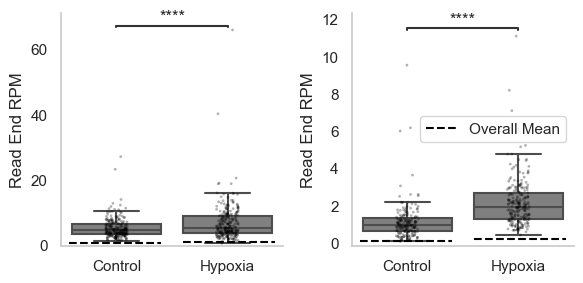

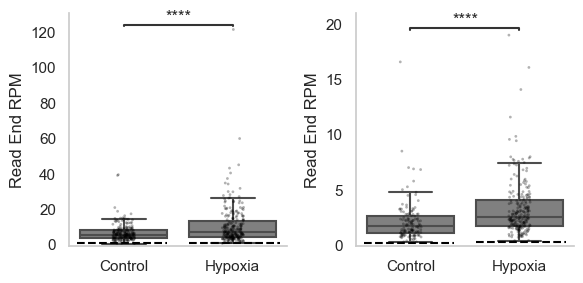

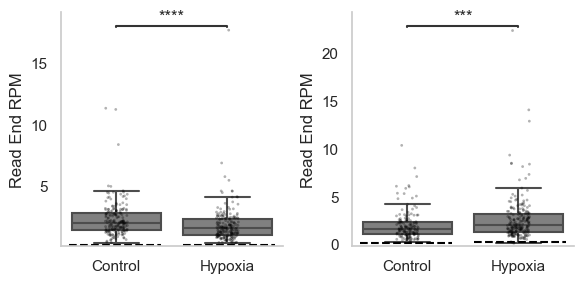

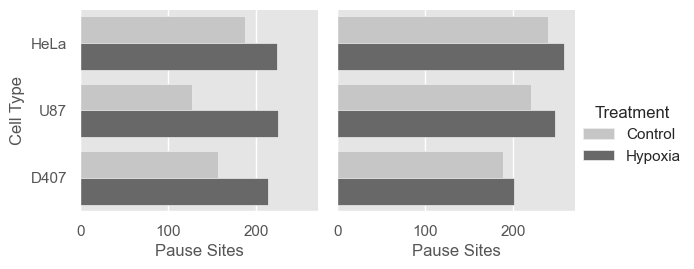

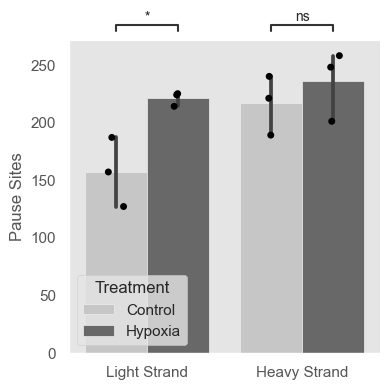

In [ ]:
reload(pic)
# Try different combinations of z_thresh and window size
w=201
#print(f'Z-threshold: {z_thresh}, Window size: {w}')
#hela_pause = pic.pausing_index_calculator(hela,  y = ['read_end_RPM', 'read_start_RPM'], window_size = w)
#u87_pause = pic.pausing_index_calculator(u87,  y = ['read_end_RPM', 'read_start_RPM'], window_size = w)
#d407_pause = pic.pausing_index_calculator(d407,  y = ['read_end_RPM', 'read_start_RPM'], window_size = w)

pairs = [('Control', 'Hypoxia')]
y = 'read_end_RPM'
# If dfs is a list of DataFrames, concatenate them first
# Set theme to whitegrid
sns.set_theme(style = 'whitegrid')
pos_pausing_dfs = dfs[(dfs['pos_read_end_RPM_window_Z_mean'] > z_thresh) & (dfs['pos_read_end_RPM_peak'] > peak_thresh)]
neg_pausing_dfs = dfs[(dfs['neg_read_end_RPM_window_Z_mean'] > z_thresh) & (dfs['neg_read_end_RPM_peak'] > peak_thresh)]

for cell in ['hela', 'u87', 'd407']:
    _, ax = plt.subplots(1, 2, figsize = (6, 3), sharey = False)
    cur_df = dfs[(dfs['cell'] == cell)]
    pos_pause_sites = pos_pausing_dfs[pos_pausing_dfs['cell'] == cell]
    neg_pause_sites = neg_pausing_dfs[neg_pausing_dfs['cell'] == cell]
    pos_random_sites = [i for i in dfs['Position'].unique() if i not in pos_pause_sites]
    neg_random_sites = [i for i in dfs['Position'].unique() if i not in neg_pause_sites]
    # Keep only pause sites that are in both Hypoxia and Control
    pos_random_sites = cur_df[cur_df['Position'].isin(pos_random_sites)]
    neg_random_sites = cur_df[cur_df['Position'].isin(neg_random_sites)]
    pos_random_mean = pos_random_sites.groupby('treatment').mean()[[f'pos_{y}']]
    neg_random_mean = neg_random_sites.groupby('treatment').mean()[[f'neg_{y}']]
    pos_hypx_random_mean = pos_random_mean.loc['Hypoxia', f'pos_{y}']
    pos_cont_random_mean = pos_random_mean.loc['Control', f'pos_{y}']
    neg_hypx_random_mean = neg_random_mean.loc['Hypoxia', f'neg_{y}']
    neg_cont_random_mean = neg_random_mean.loc['Control', f'neg_{y}']
    # Show a boxplot without outliers
    sns.boxplot(data = pos_pause_sites, x = 'treatment', y = f'pos_{y}', ax = ax[0], showfliers = False, color = 'grey')
    # Set ylims to be the same for both plots
    ylims1 = ax[0].get_ylim()
    sns.boxplot(data = neg_pause_sites, x = 'treatment', y = f'neg_{y}', ax = ax[1], showfliers = False, color = 'grey')
    # Get ylims of both plots
    ylims2 = ax[1].get_ylim()
    # Add stripplot with very small and transparent dots
    # Remove outliers from stripplot

    sns.stripplot(data = pos_pause_sites, x = 'treatment', y = f'pos_{y}', ax = ax[0], color = 'black', size = 2, alpha = .3)
    sns.stripplot(data = neg_pause_sites, x = 'treatment', y = f'neg_{y}', ax = ax[1], color = 'black', size = 2, alpha = .3)
    # Set ylims to the maximum of both plots
    ax[0].set(ylim = ylims1)
    ax[1].set(ylim = ylims2)

    ax[0].axhline(pos_hypx_random_mean, color = 'black', linestyle = '--', xmin = .55, xmax = .965, label = 'Overall Mean')
    ax[0].axhline(pos_cont_random_mean, color = 'black', linestyle = '--', xmin = .035, xmax = .45)
    ax[1].axhline(neg_hypx_random_mean, color = 'black', linestyle = '--', xmin = .55, xmax = .965, label = 'Overall Mean')
    ax[1].axhline(neg_cont_random_mean, color = 'black', linestyle = '--', xmin = .035, xmax = .45)
    ax[0].set_title(f'{cell.capitalize()} Heavy Strand')
    ax[1].set_title(f'{cell.capitalize()} Light Strand')
    ax[0].set_ylabel('Read End RPM')
    ax[1].set_ylabel('Read End RPM')
    ax[0].set_xlabel('')
    ax[1].set_xlabel('')


    annotator = Annotator(ax = ax[0], pairs = pairs, data = pos_pause_sites, x = 'treatment', y = f'pos_{y}')
    annotator.configure(test = 'Mann-Whitney', text_format = 'star', verbose = 0)
    annotator.apply_and_annotate()
    annotator = Annotator(ax = ax[1], pairs = pairs, data = neg_pause_sites, x = 'treatment', y = f'neg_{y}')
    annotator.configure(test = 'Mann-Whitney', text_format = 'star', verbose = 0)
    annotator.apply_and_annotate()
    # Remove titles
    ax[0].set_title('')
    ax[1].set_title('')
    if cell == 'hela':
        ax[1].legend()
    # Remove grid
    ax[0].grid(False)
    ax[1].grid(False)
    # Despine
    sns.despine()
    plt.tight_layout()

    plt.savefig(os.path.join(PATH, 'proseq', 'figures', f'{cell}_pause_sites_comparison_window_{w}_zthresh_{z_thresh}_new.svg'))
# Import test of independence
pvalues = {}
pvalues_to_asterisk = {0.05 : '*', 0.01 : '**', 0.001 : '***'}
# Compare the number of pause sites in hypoxia and control for each cell type
proseq_cells = ['hela', 'u87', 'd407']
reload(utils)

summary_df_proseq = summary_df[summary_df['cell'].isin(proseq_cells)]
summary_df_proseq_long = summary_df_proseq.melt(id_vars='cell', var_name='treatment', value_name='pause_sites')
summary_df_proseq_long['treatment'] = summary_df_proseq_long['treatment'].str.replace('_pause_sites', '')
# Melt again for strand
summary_df_proseq_long[['Strand', 'Treatment']] = summary_df_proseq_long['treatment'].str.split('_', expand=True)
summary_df_proseq_long = summary_df_proseq_long.drop(columns='treatment')
# Rename neg:Negative and pos:Positive
summary_df_proseq_long['Strand'] = summary_df_proseq_long['Strand'].replace({'neg': 'Negative', 'pos': 'Positive'})
# Rename ctrl:Control and hypoxia:Hypoxia
summary_df_proseq_long['Treatment'] = summary_df_proseq_long['Treatment'].replace({'ctrl': 'Control', 'hypoxia': 'Hypoxia'})
# Plot
g = sns.catplot(data=summary_df_proseq_long, y='cell', x='pause_sites', hue='Treatment', col='Strand', kind='bar', height=3, aspect=1, palette= 'Greys')
# Create a 2x2 contingency table for each cell line to test for independence between treatment and strand
for cell in proseq_cells:
    table = summary_df_proseq_long[summary_df_proseq_long['cell'] == cell].pivot_table(index='Treatment', columns='Strand', values='pause_sites', aggfunc='sum')
    chi2, p, dof, expected = chi2_contingency(table)
    pvalues[cell] = p
# Change labels
g.set_axis_labels('Pause Sites', 'Cell Type')
# Change y ticklabels to ['HeLa', 'U87', 'D407']
g.set_yticklabels(['HeLa', 'U87', 'D407'])
# Change titles
g.set_titles('')
# Savefig
plt.savefig(os.path.join(PATH, 'proseq', 'figures', f'pause_sites_comparison_per_cell_line_window_{w}_zthresh_{z_thresh}_new.png'), dpi=300)

_, ax = plt.subplots(1, 1, figsize=(4, 4))
sns.stripplot(data=summary_df_proseq_long, x='Strand', y='pause_sites', hue='Treatment', dodge=True, palette=['black'], ax=ax, label = '')
sns.barplot(data=summary_df_proseq_long, x='Strand', y='pause_sites', hue='Treatment', palette='Greys', ax=ax)
# Add dots
ax.set_ylabel('Pause Sites')
ax.set_xlabel('')
# Compare the number of pause sites in hypoxia and control for each strand
proseq_strands = ['Positive', 'Negative']
annotator = Annotator(ax = ax, pairs = [(('Negative', 'Control'), ('Negative', 'Hypoxia')), (('Positive', 'Control'), ('Positive', 'Hypoxia'))], data = summary_df_proseq_long, x = 'Strand', y = 'pause_sites', hue = 'Treatment')
annotator.configure(test = 't-test_ind', text_format = 'star', loc = 'outside')
annotator.apply_and_annotate()
sns.despine()
# Change the x axis labels to ['Light Strand', 'Heavy Strand']
ax.set_xticklabels(['Light Strand', 'Heavy Strand'])
# Remove the stripplot legend ONLY
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[2:], labels=labels[2:], title='Treatment')
# Remove grid
ax.grid(False)
# Tight
plt.tight_layout()
plt.savefig(os.path.join(PATH, 'proseq', 'figures',  f'pause_sites_comparison_{w}_zthresh_{z_thresh}.svg'))